<a href="https://colab.research.google.com/github/Beerschtein/Portfolio/blob/main/Detection_of_objects_in_the_photo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import tempfile
from io import BytesIO
from PIL import Image, ImageOps, ImageDraw, ImageFont, ImageColor
from urllib.request import urlopen
import numpy as np

import tensorflow as tf
import tensorflow_hub as hub
from time import time

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

In [ ]:
def resize_image(filename, new_width=256, new_height=256, display=False):
  pil_image = Image.open(filename)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [ ]:
!wget 'https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1Al_WOn84fUGRJjO5y8FpFm7c23BKMsSF' -O photos.zip

--2022-07-19 18:54:12--  https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1Al_WOn84fUGRJjO5y8FpFm7c23BKMsSF
Resolving drive.google.com (drive.google.com)... 108.177.127.113, 108.177.127.100, 108.177.127.138, ...
Connecting to drive.google.com (drive.google.com)|108.177.127.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-10-18-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/qkip31harqd950qiv4g1jo0o3csak9e1/1658256825000/06840004559052771215/*/1Al_WOn84fUGRJjO5y8FpFm7c23BKMsSF?e=download&uuid=d30a4096-473c-4376-8cd0-56572720013f [following]
--2022-07-19 18:54:13--  https://doc-10-18-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/qkip31harqd950qiv4g1jo0o3csak9e1/1658256825000/06840004559052771215/*/1Al_WOn84fUGRJjO5y8FpFm7c23BKMsSF?e=download&uuid=d30a4096-473c-4376-8cd0-56572720013f
Resolving doc-10-18-docs.googleusercontent.com (doc-10-18-docs.googleusercontent.com)

In [ ]:
!unzip photos.zip

Archive:  photos.zip
replace photo1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: photo1.jpg              
  inflating: __MACOSX/._photo1.jpg   
replace photo2.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: photo2.jpg              
  inflating: __MACOSX/._photo2.jpg   


Image downloaded to photo1.jpg.


'photo1.jpg'

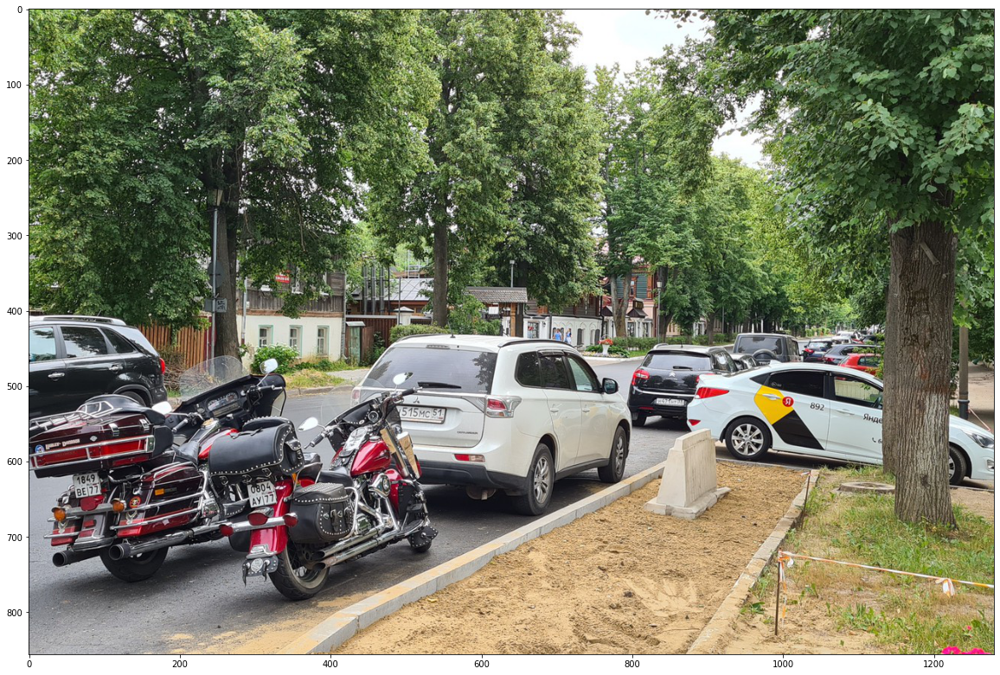

In [ ]:
resize_image('photo1.jpg', 1280, 856, True)

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time()
  result = detector(converted_img)
  end_time = time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  109.02998375892639


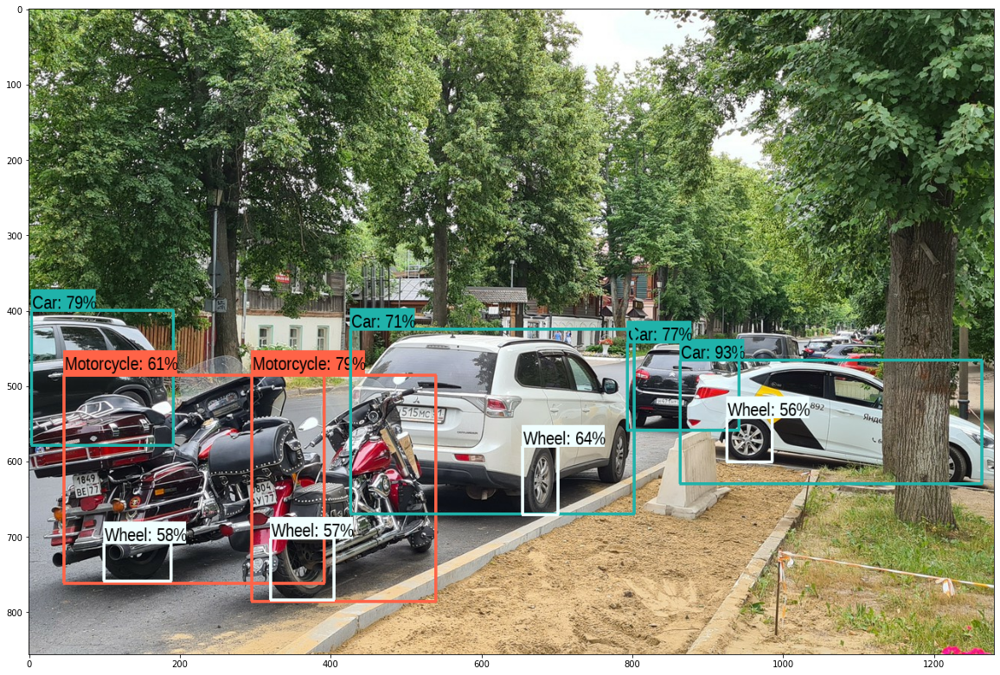

In [ ]:
run_detector(detector, 'photo1.jpg')

Image downloaded to photo2.jpg.


'photo2.jpg'

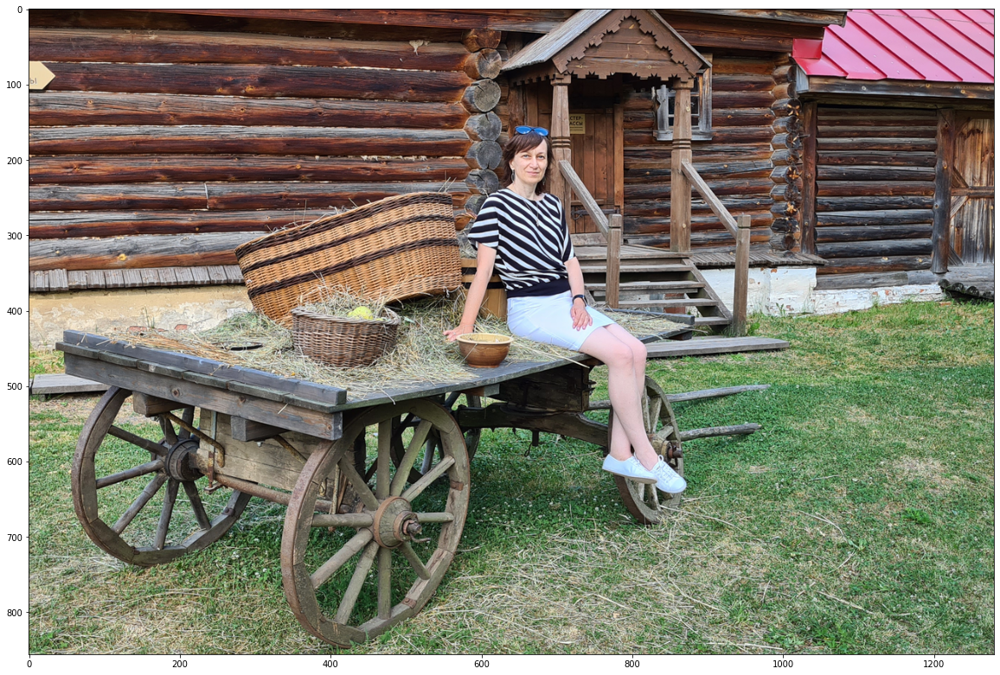

In [ ]:
resize_image('photo2.jpg', 1280, 856, True)

Found 100 objects.
Inference time:  38.66064453125


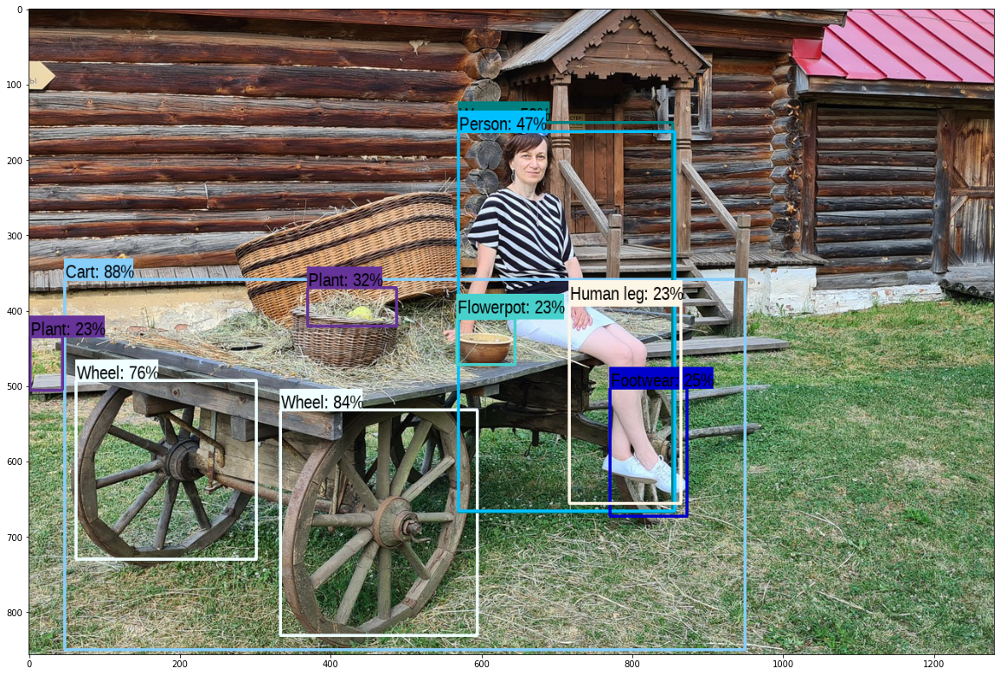

In [ ]:
run_detector(detector, 'photo2.jpg')